メモ：

済・ロス関数部分に波形を6つ分連結して、STFTを行う処理を追加する

済・モデルを畳み込みする形にしてみる

済・ドライブマウントしてモデルを保存する

済・モデルの読み込みを実装

済・Tensor like not close!を解決する

済・再構成誤差をSTFTにした際の適切なモデルを検討する
  -> Conv1Dが良さそう

・窓関数を出力にかけるというアイデア

済・LINE通知を実施する

済・ローパスハイパス、フィルタードノイズ層 -> 不要

済・ラベルを使って操作（CVAE実装？）

・ラベル付け手法について検討

#1.前準備


##必要なライブラリやモジュールの準備

In [47]:
#@title 実行環境選択とスタートアップ { display-mode: "form" }

from enum import Enum

class Mode(Enum):
    jupyter = 1
    colab = 2

mode = Mode.jupyter #@param ["Mode.colab","Mode.jupyter"] {type:"raw"}

if mode == Mode.colab:
    from google.colab import drive #インポート
    drive.mount('/content/gdrive') #GoogleDriveのマウント
    
    !pip install pytorch_lightning --quiet
    !pip install wget --quiet
    !pip install einops --quiet
    #!pip install torch torchaudio --quiet
    #!pip install torch --quiet
    #!pip install librosa --quiet

from pathlib import Path
from typing import Any, Callable, Dict, List, Optional, Tuple
from torch.utils.data import DataLoader, Dataset #追加
from einops import rearrange

import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional
import torch.optim as optim
import torchvision
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import gdown
import random
import numpy as np
import os

In [48]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


##ユーティリティ関数達

In [49]:
#-------------------------------------------------------------------------------
# Preparation of data and helper functions.
#-------------------------------------------------------------------------------
import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import requests
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio, display


def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None): #2Dのデータを表示
  fig, axs = plt.subplots(1, 1) #FigureとAxesを作成
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect) #imshow: 画像出力
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

def align_seconds(wav,sr =16000, second=3):
    wav = wav[:,:sr*second]
    return wav

def model_eval(wav,attrs):
    with torch.no_grad():
        model.eval()
        spec = model(wav.to(model.device),attrs)
        model.train()
    return spec

##Seed値固定

In [50]:
#Seed値
SEED = 42

def torch_fix_seed(seed=42):
    # Python random
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Pytorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    #torch.backends.cudnn.deterministic = True

torch_fix_seed(SEED)

##データセットダウンロード

In [51]:
import shutil #zip解凍用

FILENAME = "AKWF_16k_80s"
DOWNLOAD_NAME = FILENAME + ".zip"
ID = "13-G2TLyQP0XTQlwml0bd423c0meQlI_M"
URL = "https://drive.google.com/uc?id=" + ID

#既にダウンロード済みであったらダウンロードしないように変更
def download_dataset():
  cwd = os.getcwd()
  if os.path.exists(os.path.join(cwd, DOWNLOAD_NAME)):
      return
  else: # Datasetダウンロードとunzip
    gdown.download( URL , DOWNLOAD_NAME , quiet=True) #全部で4158個のファイル
    shutil.unpack_archive(DOWNLOAD_NAME)

download_dataset()
NUM_TRAIN = 3158 #trainの数
NUM_VAL = 1000 #valの数

In [52]:
import shutil #zip解凍用

FILENAME = "AKWF_44k1_600s"
DOWNLOAD_NAME = FILENAME + ".zip"
ID = "1ZOC4BL7NipmVXWCdwlNls64eAupq3Vjg"
URL = "https://drive.google.com/uc?id=" + ID

#既にダウンロード済みであったらダウンロードしないように変更
def download_dataset():
  cwd = os.getcwd()
  if os.path.exists(os.path.join(cwd, DOWNLOAD_NAME)):
      return
  else: # Datasetダウンロードとunzip
    gdown.download( URL , DOWNLOAD_NAME , quiet=True) #全部で4158個のファイル
    shutil.unpack_archive(DOWNLOAD_NAME)

download_dataset()
NUM_TRAIN = 3158 #trainの数
NUM_VAL = 1000 #valの数

In [53]:
#当該フォルダに保存できたか確認
wavepath = list(Path(FILENAME).glob("**/*.wav"))
print(wavepath[:3])

[PosixPath('AKWF_44k1_600s/AKWF_0784.wav'), PosixPath('AKWF_44k1_600s/AKWF_granular_0022.wav'), PosixPath('AKWF_44k1_600s/AKWF_raw_0005.wav')]


# 2.各クラスの作成

## Datasetクラスの作成

In [54]:
import json
from os import path

#参考 : https://github.com/morris-frank/nsynth-pytorch/blob/master/nsynth/data.py

class AKWDDataset(torch.utils.data.Dataset):

    # downladed from Adventure Kid Research & Technology (AKRT) website.
    # Link : https://www.adventurekid.se/akrt/waveforms/adventure-kid-waveforms/
    # deleated streo data. (200data)

    def __init__(self, root:str): #ここでファイル名変更　”nsynth-subset” or "nsynth-test/audio"
        super().__init__()
        self.root = root
        self.wave_paths = [str(p) for p in Path(self.root).glob("**/*.wav")]
        
        print(f'Loading AKWD data from {self.root}')
        print(f'\tFound {len(self)} samples.')
        assert len(self) > 0, f'No samples found in {self.root}'


    def __len__(self):
        return len(self.wave_paths)

    def __getitem__(self, idx: int)-> Tuple[Any, Any]:

        #Args:
        #    index (int): Index
        #Returns:
        #    tuple: (image, target) where target is index of the target class.

        #入力
        audio, sample_rate = torchaudio.load(self.wave_paths[idx])
        
        # wave_paths[idx]
        with open(f'AKWF_44k1_600s/labels/{Path(self.wave_paths[idx]).stem}_analysis.json', 'r') as fp:
            attrs = json.load(fp)

        #attrs['audio'] = waveform
        attrs['name'] = Path(self.wave_paths[idx]).name

        return audio , attrs

Loading AKWD data from AKWF_44k1_600s
	Found 4158 samples.


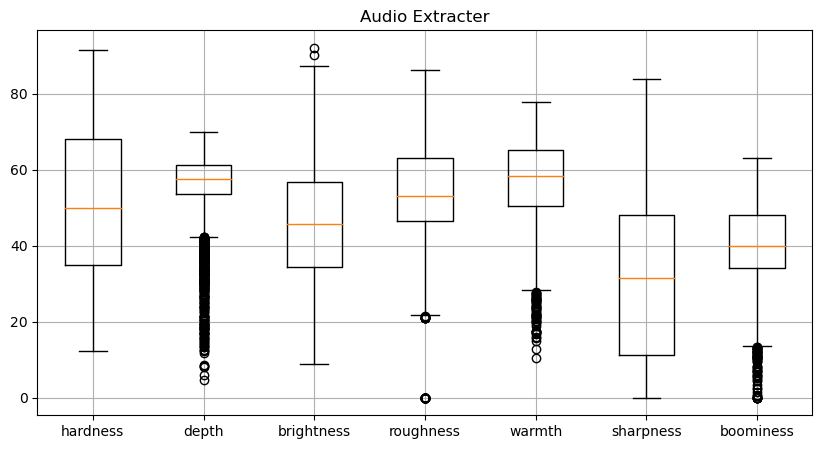

In [55]:
#labelの詳細を可視化
%matplotlib inline 
import matplotlib.pyplot as plt

if mode == Mode.jupyter:
    dataset = AKWDDataset(root="AKWF_44k1_600s")
elif mode == Mode.colab:
    dataset = AKWDDataset(root="/content/AKWF_44k1_600s")

hardness = []
depth = []
brightness = []
roughness = []
warmth = []
sharpness = []
boominess = []

for i in range(len(dataset)):

    audio, attrs = dataset[i]

    hardness.append(attrs["hardness"])
    depth.append(attrs["depth"])
    brightness.append(attrs["brightness"])
    roughness.append(attrs["roughness"])
    warmth.append(attrs["warmth"])
    sharpness.append(attrs["sharpness"])
    boominess.append(attrs["boominess"])

#print(hardness)
#print(depth)

# 点数のタプル
points = (hardness, depth, brightness, roughness, warmth, sharpness, boominess)

# 箱ひげ図
fig, ax = plt.subplots(1,1,figsize=(10,5))

bp = ax.boxplot(points) # 複数指定する場合はタプル型で渡します。
ax.set_xticklabels(["hardness", "depth", "brightness", "roughness", "warmth", "sharpness", "boominess"])

plt.title('Audio Extracter')
plt.grid() # 横線ラインを入れることができます。

# 描画
plt.show()

In [56]:
"""
plt.hist(boominess, bins=32)
plt.show
"""

'\nplt.hist(boominess, bins=32)\nplt.show\n'

In [57]:
if mode == Mode.jupyter:
    dataset = AKWDDataset("AKWF_44k1_600s") # for your machine
if mode == Mode.colab:
    dataset = AKWDDataset("/content/AKWF_44k1_600s") # for google colab

for i in range(3):
    audio, attrs = dataset[i]
    print(audio.shape)
    print(attrs['name'])
    print(attrs['brightness'])
    print(i)

Loading AKWD data from AKWF_44k1_600s
	Found 4158 samples.
torch.Size([1, 600])
AKWF_0784.wav
41.812464663505786
0
torch.Size([1, 600])
AKWF_granular_0022.wav
25.670238686422493
1
torch.Size([1, 600])
AKWF_raw_0005.wav
60.26227736010717
2


torch.Size([1, 600])
AKWF_0784.wav


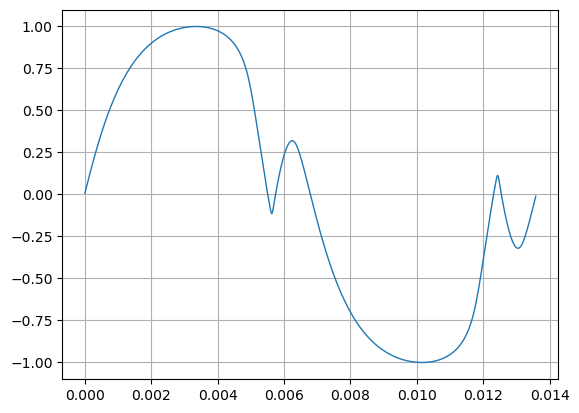

In [58]:
audio , attrs = dataset[0]
print(audio.shape)
print(attrs['name'])

#play_audio(waveform, 44100)
plot_waveform(audio, 44100, title="")
#plot_specgram(waveform,44100)

## DataModuleクラスの作成

In [59]:
# LightningDataModuleはDataLoaderとなるクラス

class AWKDDataModule(pl.LightningDataModule):    

    def __init__(self, batch_size:int, data_dir:str):
        super().__init__() #親クラスのinit

        dataset = AKWDDataset(root=data_dir)

        self.train_dataset, self.val_dataset = torch.utils.data.random_split( #trainとvalを分ける
            dataset, [NUM_TRAIN, NUM_VAL]
        )

        self.test_dataset = AKWDDataset(root=data_dir)
        self.batch_size = batch_size
        self.data_dir = data_dir

    def train_dataloader(self): # Train用DataLoaderの設定
        return torch.utils.data.DataLoader(
            self.train_dataset, batch_size=self.batch_size
        )

    def val_dataloader(self): # val用DataLoaderの設定
        return torch.utils.data.DataLoader(
            self.val_dataset, batch_size=self.batch_size
        )

    def test_dataloader(self): # Test用DataLoaderの設定
        return torch.utils.data.DataLoader(
            self.test_dataset, batch_size=self.batch_size
        )

    def predict_dataloader(self):
        return torch.utils.data.DataLoader(
            self.test_dataset, batch_size=self.batch_size
        )

## LightningModuleクラスの作成

ロス関数参考：
https://discuss.pytorch.org/t/rmse-loss-function/16540/7

VAE化参考：
https://github.com/reoneo97/vae-playground/blob/main/models/vae.py

In [60]:
label_num = 2
a = torch.randn(10,1,600*label_num)
sample_points = 600

encoder = nn.Sequential(
    nn.Conv1d(in_channels=1, out_channels=64, kernel_size=7, stride=2, padding=0), nn.LeakyReLU(),
    nn.BatchNorm1d(64),
    nn.Conv1d(in_channels=64, out_channels=128, kernel_size=7, stride=2, padding=0), nn.LeakyReLU(),
    nn.BatchNorm1d(128),
    nn.Conv1d(in_channels=128, out_channels=256, kernel_size=7, stride=2, padding=0), nn.LeakyReLU(),
    nn.BatchNorm1d(256),
    nn.Conv1d(in_channels=256, out_channels=512, kernel_size=6, stride=1, padding=0), nn.LeakyReLU(),
    )

mean = nn.Conv1d(in_channels=512, out_channels=128, kernel_size=1, stride=1, padding=0)
var = nn.Conv1d(in_channels=512, out_channels=128, kernel_size=1, stride=1, padding=0)

b = encoder(a)
c = mean(b)
#print(b.shape)
print(c.shape)

torch.Size([10, 128, 140])


In [61]:
c = torch.randn(10,1024,140)

decoder = nn.Sequential(
    nn.ConvTranspose1d(in_channels=1024, out_channels=512, kernel_size=10, stride=2, padding=0), nn.LeakyReLU(.2), 
    nn.ConvTranspose1d(in_channels=512, out_channels=256, kernel_size=10, stride=2, padding=0), nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=256, out_channels=128, kernel_size=9, stride=1, padding=0), nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=128, out_channels=64, kernel_size=9, stride=1, padding=0), nn.LeakyReLU(.2),
    #Residual block
)

d = decoder(c)
print(d.shape)

torch.Size([10, 64, 600])


In [62]:
# Define block
class ResBlock(nn.Module):
    def __init__(self, channel):
        super(ResBlock, self).__init__()
        self.resBlock = nn.Sequential(
            nn.LeakyReLU(.2),
            nn.Conv1d(in_channels=channel , out_channels=channel, kernel_size=1, stride=1, padding=0)
            )

    def forward(self, x:torch.Tensor) -> torch.Tensor:
        #print(x.shape)
        residual = x
        x = self.resBlock(x)
        out = x + residual
        return out

In [63]:
upSampling1 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=128, out_channels=64, kernel_size=10, stride=2, padding=0),
)
res_block1 = ResBlock(64)

upSampling2 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=64, out_channels=32, kernel_size=10, stride=2, padding=0),
)
res_block2 = ResBlock(32)

upSampling3 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=32, out_channels=16, kernel_size=9, stride=1, padding=0),
)
res_block3 = ResBlock(16)


upSampling4 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=16, out_channels=8, kernel_size=9, stride=1, padding=0),
)
res_block4 = ResBlock(8)

conv_out = nn.Conv1d(in_channels=8 , out_channels=1, kernel_size=1, stride=1, padding=0)

x = torch.randn(10,128,140)

modules = []
modules.extend([upSampling1, res_block1, upSampling2, res_block2, upSampling3, res_block3, upSampling4, res_block4, conv_out])
#print(modules)

decoder = nn.Sequential(*modules)
x = decoder(x)
print(x.shape)

torch.Size([10, 1, 600])


In [64]:
class Loudness(nn.Module):

    def __init__(self, sr:int, block_size:int, n_fft:int=3600):
        super().__init__()
        self.sr = sr
        self.block_size = block_size
        self.n_fft = n_fft

        f = np.linspace(0, sr / 2, n_fft // 2 + 1) + 1e-7
        a_weight = librosa.A_weighting(f).reshape(-1, 1)

        self.register_buffer("a_weight", torch.from_numpy(a_weight).float())
        self.register_buffer("window", torch.hann_window(self.n_fft))

    def forward(self, x:torch.Tensor) -> torch.Tensor:
        x = torch.stft(
            x.squeeze(1),
            self.n_fft,
            self.block_size,
            self.n_fft,
            center=True,
            window=self.window,
            return_complex=True,
        ).abs()
        x = torch.log(x + 1e-7) + self.a_weight
        return torch.mean(x, 1, keepdim=True)

In [65]:
# Define block
class ResBlock(nn.Module):
    def __init__(self, channel):
        super(ResBlock, self).__init__()
        self.resBlock = nn.Sequential(
            nn.LeakyReLU(.2),
            nn.Conv1d(in_channels=channel , out_channels=channel, kernel_size=1, stride=1, padding=0)
            )

    def forward(self, x:torch.Tensor) -> torch.Tensor:
        #print(x.shape)
        residual = x
        x = self.resBlock(x)
        out = x + residual
        return out

upSampling1 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=128+30, out_channels=64, kernel_size=8, stride=2, padding=0),
)
res_block1 = nn.Sequential(
    ResBlock(64),ResBlock(64),ResBlock(64),
)

upSampling2 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=64, out_channels=32, kernel_size=8, stride=1, padding=0),
)
res_block2 = nn.Sequential(
    ResBlock(32),ResBlock(32),ResBlock(32),
)

upSampling3 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=32, out_channels=16, kernel_size=8, stride=2, padding=0),
)
res_block3 = nn.Sequential(
    ResBlock(16),ResBlock(16),ResBlock(16),
)

upSampling4 = nn.Sequential(
    nn.LeakyReLU(.2),
    nn.ConvTranspose1d(in_channels=16, out_channels=8, kernel_size=9, stride=1, padding=0),
)
res_block4 = nn.Sequential(
    ResBlock(8),ResBlock(8),ResBlock(8),
)

conv_out = nn.Sequential(
    nn.Conv1d(in_channels=8 , out_channels=1, kernel_size=1, stride=1, padding=0),
    nn.Tanh(),
)

decoder = nn.ModuleList()
decoder.extend([upSampling1, res_block1, upSampling2, res_block2, upSampling3, res_block3, upSampling4, res_block4, conv_out])
#print(decoder)

ModuleList(
  (0): Sequential(
    (0): LeakyReLU(negative_slope=0.2)
    (1): ConvTranspose1d(158, 64, kernel_size=(8,), stride=(2,))
  )
  (1): Sequential(
    (0): ResBlock(
      (resBlock): Sequential(
        (0): LeakyReLU(negative_slope=0.2)
        (1): Conv1d(64, 64, kernel_size=(1,), stride=(1,))
      )
    )
    (1): ResBlock(
      (resBlock): Sequential(
        (0): LeakyReLU(negative_slope=0.2)
        (1): Conv1d(64, 64, kernel_size=(1,), stride=(1,))
      )
    )
    (2): ResBlock(
      (resBlock): Sequential(
        (0): LeakyReLU(negative_slope=0.2)
        (1): Conv1d(64, 64, kernel_size=(1,), stride=(1,))
      )
    )
  )
  (2): Sequential(
    (0): LeakyReLU(negative_slope=0.2)
    (1): ConvTranspose1d(64, 32, kernel_size=(8,), stride=(1,))
  )
  (3): Sequential(
    (0): ResBlock(
      (resBlock): Sequential(
        (0): LeakyReLU(negative_slope=0.2)
        (1): Conv1d(32, 32, kernel_size=(1,), stride=(1,))
      )
    )
    (1): ResBlock(
      (resBloc

In [78]:
from scipy import signal

class LitAutoEncoder(pl.LightningModule): #Linear layer only
    
    def __init__(self, sample_points: int =600, hidden_dim: int=128, embed_dim: int=32, beta: float=1, duplicate_num: int=6): #Define computations here
        super().__init__()
        assert sample_points == 600

        self.sample_points = sample_points
        self.duplicate_num = duplicate_num 
        #self.logging_graph_flg = True

        self.encoder = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=64, kernel_size=9, stride=1, padding=0), nn.LeakyReLU(),
            nn.BatchNorm1d(64),
            nn.Conv1d(in_channels=64, out_channels=128, kernel_size=9, stride=1, padding=0), nn.LeakyReLU(),
            nn.BatchNorm1d(128),
            nn.Conv1d(in_channels=128, out_channels=256, kernel_size=9, stride=2, padding=0), nn.LeakyReLU(),
            nn.BatchNorm1d(256),
            nn.Conv1d(in_channels=256, out_channels=512, kernel_size=9, stride=2, padding=0), nn.LeakyReLU(),
        )


        #self.hidden2mu = nn.Linear(embed_dim,embed_dim)
        self.hidden2mu = nn.Conv1d(in_channels=512, out_channels=128, kernel_size=1, stride=1, padding=0)
        #self.hidden2log_var = nn.Linear(embed_dim,embed_dim)
        self.hidden2log_var = nn.Conv1d(in_channels=512, out_channels=128, kernel_size=1, stride=1, padding=0)

        self.beta = beta
        self.spec =  torchaudio.transforms.Spectrogram(
                                                       #sample_rate = sample_rate,
                                                       n_fft = int(sample_points*(duplicate_num)), #時間幅
                                                       hop_length = int(sample_points*(duplicate_num)), #移動幅
                                                       win_length = int(sample_points*(duplicate_num)), #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=2.0)
        
        self.ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'magnitude',top_db = 80)
        self.loudness = Loudness(44100, 600)
        self.decoder = nn.Sequential(*decoder)

    def forward(self, x: torch.Tensor, attrs:dict)->Tuple[torch.Tensor,torch.Tensor,torch.Tensor]: # Use for inference only (separate from training_step)

        mu, log_var = self.encode(x)
        hidden = self.reparametrize(mu, log_var)
        hidden = self._conditioning(hidden,attrs,size=10)
        output = self.decode(hidden)# * torch.tensor(np.hanning(600)).to(device)
        return mu, log_var, output

    def encode(self, x:torch.Tensor)->Tuple[torch.Tensor,torch.Tensor]:
        hidden = self.encoder(x)
        mu = self.hidden2mu(hidden)
        log_var = self.hidden2log_var(hidden)
        return mu, log_var

    def reparametrize(self,mu: torch.Tensor,log_var :torch.Tensor) -> torch.Tensor:
        #Reparametrization Trick to allow gradients to backpropagate from the 
        #stochastic part of the model
        sigma = torch.exp(0.5*log_var)
        z = torch.randn_like(sigma)
        return mu + sigma * z

    def decode(self, x:torch.Tensor) -> torch.Tensor:
        x = self.decoder(x)
        return x

    def training_step(self, attrs: dict, attrs_idx:int) -> torch.Tensor: # the complete training loop
        #x ,y = attrs #x:audio, y:attrs
        #print("training_step",x.shape)
        return self._common_step(attrs, attrs_idx, "train")

    def validation_step(self, attrs: dict, attrs_idx:int) -> torch.Tensor: # the complete validation loop
        #print("validation_step")
        self._common_step(attrs, attrs_idx, "val")

    def test_step(self, attrs: dict, attrs_idx:int) -> torch.Tensor: # the complete test loop
        #print("test_step")
        #self._logging_graph(batch,batch_idx) #Tensor like not close! のerror出る
        self._common_step(attrs, attrs_idx, "test")

    def predict_step(self, attrs: dict, attrs_idx:int, dataloader_idx=None): # the complete prediction loop
        #print("predict_step")
        x, _ = attrs
        return self(x)

    def _common_step(self, batch: tuple, batch_idx:int, stage:str) -> torch.Tensor: #ロス関数定義.推論時は通らない
        x, attrs = self._prepare_batch(batch)
        mu, log_var, x_out = self.forward(x,attrs)
        spec_x = self._scw2spectrum(x)
        spec_x_out = self._scw2spectrum(x_out)
        
        # RAVE Loss
        loud_x = self.loudness(spec_x)
        loud_x_out = self.loudness(spec_ｘ_out)
        self.loud_dist = (loud_x - loud_x_out).pow(2).mean()
        self.spec_recon_loss = self.distance(spec_x,spec_x_out)
        
        #self.wave_recon_loss = torch.nn.functional.mse_loss(x, x_out) #Deep Convolutional Oscilatorで使用.ノイズ多め
        #self.recon_loss = torch.nn.functional.l1_loss(x, x_out) 
        #self.recon_loss = torch.nn.functional.l1_loss( torch.log(x + 1e-7) ,torch.log(x_out + 1e-7))#RAVEが参照していたやつ。スペクトル距離、うまくいかない
        #self.recon_loss = torch.nn.functional.l1_loss(x , x_out) + torch.nn.functional.l1_loss( torch.log(x) , torch.log(x_out) ) #DDSPのロス.良い
        #self.recon_loss = torch.norm(x - x_out) / torch.norm(x) + abs(torch.log(x + 1e-7) - torch.log(x_out + 1e-7)).mean() #RAVEで使用しているロス関数.結構いい

        kl_loss = (-0.5*(1+log_var - mu**2 - 
                         torch.exp(log_var)).sum(dim=1)) #sumは潜在変数次元分を合計させている?
        self.kl_loss = kl_loss.mean() 
        
        self.loss = self.spec_recon_loss + self.loud_dist + self.beta * self.kl_loss        
        #self.loss = self.wave_recon_loss + self.spec_recon_loss + self.loud_dist + self.beta * self.kl_loss #Condがうまくいかなくなった

        self.log(f"{stage}_kl_loss", self.kl_loss, on_step = True, on_epoch = True)
        #self.log(f"{stage}_wave_recon_loss", self.wave_recon_loss, on_step = True, on_epoch = True)
        self.log(f"{stage}_spec_recon_loss", self.spec_recon_loss, on_step = True, on_epoch = True)
        self.log(f"{stage}_loss", self.loss,on_step = True, on_epoch = True, prog_bar=True)
        return self.loss
    
    def _conditioning(self, x:torch.Tensor, attrs:dict, size:int) -> torch.Tensor:

        bright = ((attrs["brightness"]/50)-1).clone().detach() #-1~1に正規化
        rough = ((attrs["roughness"]/50)-1).clone().detach()
        depth = ((attrs["depth"]/50)-1).clone().detach()
        
        y = torch.ones([x.shape[0], size, x.shape[2]]).permute(2,1,0) #[600,1,32] or [140,256,32]
        bright_y = y.to(device) * bright.to(device) # [D,C,B]*[B]
        rough_y = y.to(device) * rough.to(device)
        depth_y = y.to(device) * depth.to(device)
        
        x = x.to(device)
        x = torch.cat([x, bright_y.permute(2,1,0)], dim=1).to(torch.float32) 
        x = torch.cat([x, rough_y.permute(2,1,0)], dim=1).to(torch.float32) 
        x = torch.cat([x, depth_y.permute(2,1,0)], dim=1).to(torch.float32) 
        #print(x.shape)
        
        return x

    def _scw2spectrum(self, x:torch.Tensor) -> torch.Tensor:
        # 波形を6つくっつけてSTFTする
        batch_size = len(x[:])
        for i in range(batch_size):
            single_channel_scw = x[i,:,:] #[32,1,600] -> [1,1,600]
            if i == 0:
                tmp = self._scw_combain(single_channel_scw) #[901,1]
            else:
                tmp = torch.cat([tmp, self._scw_combain(single_channel_scw)]) #[901*i,1]

        return tmp
 
    def _scw_combain(self, scw:torch.Tensor) -> torch.Tensor:

        scw = scw.reshape(self.sample_points) #[1,1,600] -> [600]

        for i in range(self.duplicate_num):
            if i == 0:
                tmp = scw
            else:
                tmp = torch.cat([tmp,  scw])

        spec_x = self._specToDB(tmp) # [3600] -> [901,1]
        return spec_x

    def _specToDB(self, waveform: torch.Tensor) -> torch.Tensor:
        combain_x = waveform.reshape(1, -1) # [3600] -> [1,3600]
        spec_x = combain_x
        #spec_x = self.spec(combain_x) # [1,3600] -> [901,1]
        #spec_x = self.ToDB(spec_x) #使わない方が良い結果が出てる
        return spec_x

    def _prepare_batch(self, batch:tuple) ->Tuple[torch.Tensor,torch.Tensor]: #batch準備
        x , attrs = batch
        return x, attrs

    def configure_optimizers(self): #Optimizerと学習率(lr)設定
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-5)
        return optimizer
    
    def lin_distance(self, x:torch.Tensor, y:torch.Tensor) -> torch.Tensor:
        return torch.norm(x - y) / torch.norm(x)

    def log_distance(self, x:torch.Tensor, y:torch.Tensor) -> torch.Tensor:
        return abs(torch.log(x + 1e-7) - torch.log(y + 1e-7)).mean()

    def distance(self, x:torch.Tensor, y:torch.Tensor) -> torch.Tensor:
        scales = [3600]
        x = self.multiscale_stft(x, scales, 0)
        y = self.multiscale_stft(y, scales, 0)

        lin = sum(list(map(self.lin_distance, x, y)))
        log = sum(list(map(self.log_distance, x, y)))

        return lin + log

    def multiscale_stft(self, signal:torch.Tensor, scales:list, overlap:float)-> torch.Tensor:
        """
        Compute a stft on several scales, with a constant overlap value.
        Parameters
        ----------
        signal: torch.Tensor
            input signal to process ( B X C X T )
        
        scales: list
            scales to use
        overlap: float
            overlap between windows ( 0 - 1 )
        """
        #signal = rearrange(signal, "b c t -> (b c) t")
        stfts = []
        for s in scales:
            S = torch.stft(
                signal,
                s,
                int(s * (1 - overlap)),
                s,
                torch.hann_window(s).to(signal),
                True,
                normalized=True,
                return_complex=True,
            ).abs()
            stfts.append(S)
        return stfts

    def _logging_graph(self, batch, batch_idx):
        x,attrs = self._prepare_batch(batch)
        tensorboard = self.logger.experiment
        tensorboard.add_graph(self, x) #graph表示
        
    def _logging_hparams(self):

        tensorboard = self.logger.experiment
        tensorboard.add_hparams({'N_FFT': N_FFT, 'HOP_LENGTH': HOP_LENGTH,'MELSTFT_FLG':MELSTFT_FLG, 
                                 'SEED':SEED, 'SAMPLE_RATE':SAMPLE_RATE, 'MAX_SECONDS' :MAX_SECONDS,
                                 'NUM_TRAIN':NUM_TRAIN, 'NUM_VAL':NUM_VAL, 'LOAD_IDX':LOAD_IDX, 'LR': LR, 
                                 'BATCH_SIZE': BATCH_SIZE, 'MAX_EPOCHS': MAX_EPOCHS},{})
                                #{'hparam/accuracy': 10, 'hparam/loss': 10})

## Callback設定

In [79]:
def LINENotification(comment:str)-> None:
    import requests as rt
    token = "gZJ4Mo7XWOhusuy4emJPLO5810BKPTapWw1Nvm8lfLs"
    line = "https://notify-api.line.me/api/notify"
    head = {"Authorization": "Bearer " + token}
    mes = {"message": f'{comment}'}
    rt.post(line, headers=head, data=mes)

In [80]:
def on_train_end_notification(comment:str)-> None:
    import datetime
    d_today = datetime.date.today()
    t_now = datetime.datetime.now().time()
    model_name = model.__class__.__name__

    comment = f'{d_today}-{t_now}-{model_name}-{MAX_EPOCHS}epoch{comment}の学習終了！'
    LINENotification(comment)

In [81]:
class MyPrintingCallback(pl.callbacks.Callback):
    def __init__(self):
        super().__init__()

    def on_train_start(self, trainer, pl_module):
        print("Training is starting")

    def on_train_end(self, trainer: pl.Trainer, model: pl.LightningModule) -> None:
        #model._logging_hparams()
        #x = torch.randn(32, 600, 1)
        #tensorboard = model.logger.experiment
        #tensorboard.add_graph(model, x) #graph表示
        on_train_end_notification("RAVEModel_Loudness")
        LINENotification(f" \n loss : {round(float(model.loss),4)} \
                            \n kl_loss : {round(float(model.kl_loss),4)} \
                            \n spec_recon_loss : {round(float(model.spec_recon_loss),4)} \
                            \n loud_dist : {round(float(model.loud_dist),4)}")
        print("Training is ending")

# 3.学習

function ClickConnect(){
  console.log("60sごとに再接続");
  document.querySelector("colab-connect-button").click()
}
setInterval(ClickConnect,1000*60);

In [82]:
if mode == Mode.jupyter:
    dm = AWKDDataModule(batch_size=32, data_dir="AKWF_44k1_600s") 
    #dm = AWKDDataModule(batch_size=32, data_dir="AKWF_16k_80s")
elif mode == Mode.colab:
    dm = AWKDDataModule(batch_size=32, data_dir="/content/AKWF_44k1_600s")
    #dm = AWKDDataModule(batch_size=32, data_dir="/content/AKWF_16k_80s")

model = LitAutoEncoder(sample_points = 600, hidden_dim = 512, embed_dim = 140, beta = 0.1) #44k1 Conv #hidden_dimは使ってない
#model = LitAutoEncoder(sample_points = 600, hidden_dim = 512, embed_dim = 128, beta = 1) #44k1
#model = LitAutoEncoder(sample_points = 218, hidden_dim = 512, embed_dim = 128, beta = 1) #resample=1.6kの時は218
model = model.to(device)
print(device)

Loading AKWD data from AKWF_44k1_600s
	Found 4158 samples.
Loading AKWD data from AKWF_44k1_600s
	Found 4158 samples.
cpu


In [83]:
import glob
def find_latest_checkpoints(checkpoint_dir):
    ckpts = sorted(glob.glob(checkpoint_dir+"/*.ckpt"))
    if len(ckpts) == 0:
        return None
    else:
        return ckpts[-1]

checkpoint_dir = "lightning_logs/*/checkpoints"
resume_ckpt = find_latest_checkpoints(checkpoint_dir)

print(resume_ckpt)

lightning_logs/version_9/checkpoints/epoch=0-step=99.ckpt


In [84]:
!ls lightning_logs/version_46/checkpoints

ls: lightning_logs/version_46/checkpoints: No such file or directory


In [85]:
from mmap import ACCESS_COPY
MAX_EPOCHS = 1 #@param {type:"integer"}
ACCELATOR_TYPE = "CPU"  #@param ["GPU","CPU","MPS"] {type:"raw"}

TRAIN_FLG = True #@param {type:"boolean"}
TEST_FLG = False #@param {type:"boolean"}
RESUME_CKPT_FLG = False #@param {type:"boolean"}

if TRAIN_FLG:
    if ACCELATOR_TYPE == "GPU":
        trainer = pl.Trainer(
            max_epochs=MAX_EPOCHS , enable_checkpointing=True, log_every_n_steps=1, callbacks=[MyPrintingCallback()],
            auto_lr_find = True, auto_scale_batch_size = True, accelerator='gpu', devices=1,
        )
    if ACCELATOR_TYPE == "CPU":
        trainer = pl.Trainer(
            max_epochs=MAX_EPOCHS , enable_checkpointing=True, log_every_n_steps=1, callbacks=[MyPrintingCallback()],
            auto_lr_find = True, auto_scale_batch_size = True, accelerator='cpu',
        )
    if ACCELATOR_TYPE == "MPS": #can't use MPS 
        trainer = pl.Trainer(
            max_epochs=MAX_EPOCHS , enable_checkpointing=True, log_every_n_steps=1, callbacks=[MyPrintingCallback()],
            auto_lr_find = True, auto_scale_batch_size = True, accelerator='mps', devices=1,#gpus=1,
        )
    if RESUME_CKPT_FLG:
        trainer.fit(model, dm ,ckpt_path=resume_ckpt)
    else:
        trainer.fit(model, dm )

if TEST_FLG:
    model.eval()
    trainer.test(model, dm,)
    model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name           | Type          | Params
-------------------------------------------------
0 | encoder        | Sequential    | 1.6 M 
1 | hidden2mu      | Conv1d        | 65.7 K
2 | hidden2log_var | Conv1d        | 65.7 K
3 | spec           | Spectrogram   | 0     
4 | ToDB           | AmplitudeToDB | 0     
5 | loudness       | Loudness      | 0     
6 | decoder        | Sequential    | 119 K 
-------------------------------------------------
1.8 M     Trainable params
0         Non-trainable params
1.8 M     Total params
7.206     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training is starting


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Training is ending


### 保存

In [72]:
#@markdown #### モデルをDriveに保存

SAVE_MODEL_FLG = True #@param {type:"boolean"}
comment = "CVAE-Cond10ch-wavelossON"

import datetime
d_today = datetime.date.today()
t_now = datetime.datetime.now().time()
model_name = model.__class__.__name__

if SAVE_MODEL_FLG: 
    model_save_name = f'{d_today}-{t_now}-{model_name}-{MAX_EPOCHS}epoch{comment}.pth' # 保存ファイル名
    #path = F"/content/gdrive/MyDrive/Colab Notebooks/MachineLerning/{model_save_name}" # 保存先pathの設定
    path = F"{model_save_name}"
    torch.save(model.state_dict(), path) # 保存

#### 読み込み

In [31]:
!ls

2022-10-23-22:05:56.306290-LitAutoEncoder-1000epochCVAE-Proto-brightness.pth
2022-10-25-20:09:04.442020-LitAutoEncoder-5000epochCVAE-Cond10.pth
2022-10-26-07:16:19.337448-LitAutoEncoder-10000epochCVAE-Cond10.pth
2022-10-26-09:01:50.929509-LitAutoEncoder-1000epochCVAE-Cond10.pth
2022-10-27-00:13:20.384217-LitAutoEncoder-10000epochCVAE-Cond10.pth
2022-10-27-15:37:27.536583-LitAutoEncoder-20000epochCVAE-Cond1ch.pth
2022-10-28-08:19:47.351952-LitAutoEncoder-10000epochCVAE-Cond10ch.pth
2022-11-03-11:18:16.803119-LitAutoEncoder-10000epochCVAE-Cond1ch-beta1.pth
2022-11-06-08:50:58.995143-LitAutoEncoder-10000epochCVAE-Cond5ch-wavelossON.pth
AKWF_16k_80s
AKWF_16k_80s.zip
AKWF_44k1_600s
AKWF_44k1_600s.zip
README.md
doc
lightning_logs
pytorch_lightning_VAE4Wavetable.ipynb


In [32]:
#@markdown #### モデルの読み込みをDriveから実施
READ_MODEL_FLG =True #@param {type:"boolean"}
if READ_MODEL_FLG:
    model_path = '2022-11-06-08:50:58.995143-LitAutoEncoder-10000epochCVAE-Cond5ch-wavelossON.pth' #@param {type:"string"}
    model.load_state_dict(torch.load(model_path))

# 4.検証

## TensorBoard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir ./lightning_logs --bind_all --port 6006

In [ ]:
CHK_BROWSER_FLG =False #@param {type:"boolean"}
if CHK_BROWSER_FLG:
    from google.colab import output
    output.serve_kernel_port_as_window(6006)

In [ ]:
UPLOAD_TENSORBOARD_FLG = False #@param {type:"boolean"}
if UPLOAD_TENSORBOARD_FLG:
    #TensorBoard.dev
    !tensorboard dev upload \
    --logdir ./lightning_logs \
    --name "(optional) My latest experiment" \
    --description "(optional) Simple comparison of several hyperparameters" \
    --one_shot

## 音源の再合成

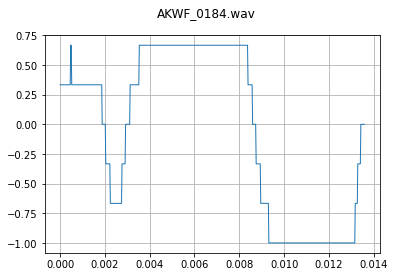

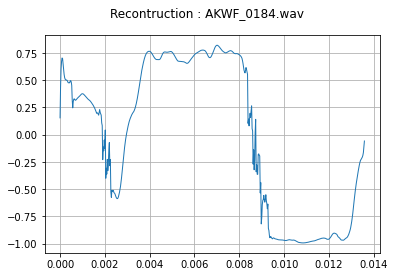

In [75]:
from cgitb import reset


model = model.to(device)

change_random_flg = True #@param {type:"boolean"}
change_brigthness_flg = False #@param {type:"boolean"}
change_rough_flg = False #@param {type:"boolean"}
change_depth_flg = False #@param {type:"boolean"}

reset_attrs_flg = False #@param {type:"boolean"}

cond_brightness = 0 #@param {type:"number"}
cond_rough = 0 #@param {type:"number"}
cond_depth = 100 #@param {type:"number"}

if change_random_flg:
    wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
else:
    wavetable, attrs = dm.train_dataset[1]
    if i == 0:
        default_brightness = attrs['brightness']
        print(default_brightness)
        default_rough = attrs['rough']
        print(default_rough)
        default_depth = attrs['depth']
        print(default_depth)
        i = i + 1
    else:
        pass

if reset_attrs_flg:
    attrs['brightness'] = default_brightness
    attrs['rough'] = default_rough
    attrs['depth'] = default_depth

if  change_brigthness_flg:
    print("brightness",attrs['brightness'])
    attrs['brightness'] = cond_brightness
    print("brightness",attrs['brightness'])

if change_rough_flg:
    print("rough",attrs['roughness'])
    attrs['roughness'] = cond_rough
    print("rough",attrs['roughness'])

if change_depth_flg:
    print("depth",attrs['depth'])
    attrs['depth'] = cond_depth
    print("depth",attrs['depth'])

_, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
predict_wavetable = predict_wavetable.cpu()
predict_wavetable = predict_wavetable[0]

#print("test2",predict_waveform.shape)

"""
fig, axs = plt.subplots(1,2, figsize=(16,5))
axs[0].pcolor(waveform)
axs[1].pcolor(predict_waveform)
"""

SAMPLE_RATE = 44100
plot_waveform(wavetable, attrs["samplerate"], title=attrs["name"])
#plot_specgram(waveform, SAMPLE_RATE)
#play_audio(waveform, SAMPLE_RATE)

plot_waveform(predict_wavetable, attrs["samplerate"], title="Recontruction : "+ attrs["name"])
#plot_specgram(predict_waveform,SAMPLE_RATE)
#play_audio(predict_waveform, SAMPLE_RATE)

#torch.nn.functional.mse_loss(waveform, predict_waveform), torch.nn.functional.smooth_l1_loss(waveform, predict_waveform), torch.nn.functional.l1_loss(waveform, predict_waveform)


In [76]:
#綺麗に描き直してユーティリティー関数に入れる

def _scw2spectrum(x,duplicate_num=6):
    # 波形を6つくっつけてSTFTする
    # [32,1,600]でくるのでそこをどうにかする
    #print(x.shape)
    batch_size = len(x[:])
    for i in range(batch_size):
        #print("_scw2spectrum1",x.shape)
        single_channel_scw = x[i,:,:] #[32,1,600] -> [1,1,600]
        #print("_scw2spectrum2",x.shape)

        if i == 0:
            tmp = _scw_combain_spec(single_channel_scw,duplicate_num) #[901,1]
            #print(tmp.shape)
            #print(i)
        else:
            tmp = torch.cat([tmp, _scw_combain_spec(single_channel_scw,duplicate_num)]) #[901*i,1]
            #print(tmp.shape)

    #combain_spec = tmp.reshape(batch_size,-1) # [32,901,1]??
    #print(combain_spec.shape)
    return tmp

def _scw_combain_spec(scw,duplicate_num=6):

    scw = scw.reshape(600) #[1,1,600] -> [600] #あとで直す
    #print("_scw2spectrum3",x.shape)

    for i in range(duplicate_num):
        if i == 0:
            tmp = scw
            #print("1",tmp.shape)
        else:
            tmp = torch.cat([tmp,  scw])
            #print("2",tmp.shape)

    spec_x = _specToDB(tmp.cpu()) # [3600] -> [1801,1]
    #print("test",spec_x.shape)
    return spec_x

def _specToDB(waveform):
    sample_points = len(waveform)
    spec =  torchaudio.transforms.Spectrogram(
                                                       #sample_rate = sample_rate,
                                                       n_fft = sample_points, #時間幅
                                                       hop_length = sample_points, #移動幅
                                                       win_length = sample_points, #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=2.0)
        
    ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'power',top_db = 80)

    combain_x = waveform.reshape(1, -1) # [3600] -> [1,3600]
    spec_x = spec(combain_x) # [1,3600] -> [901,1???]
    spec_x = ToDB(spec_x)

    return spec_x

訓練データの波形


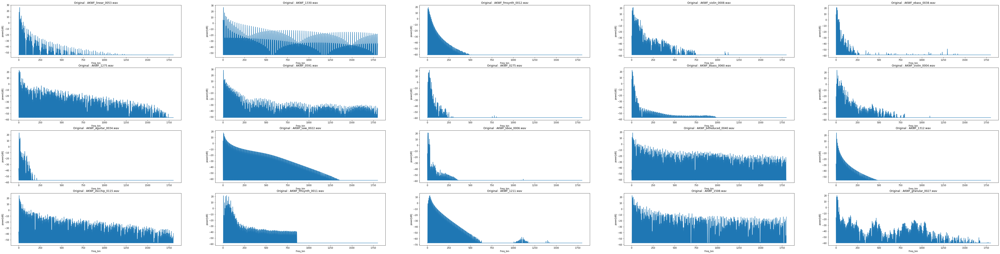

In [77]:
# 訓練データの波形を見る

nrows = 4
ncols = 5

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x
  x = x.unsqueeze(0)
  x = _scw_combain_spec(x)
  x = x.squeeze(0)
  axs[i//ncols, i%ncols].set_title("Original : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i//ncols, i%ncols].plot(x)

print("訓練データの波形")
#print(axs)

再構成データのスペクトラム


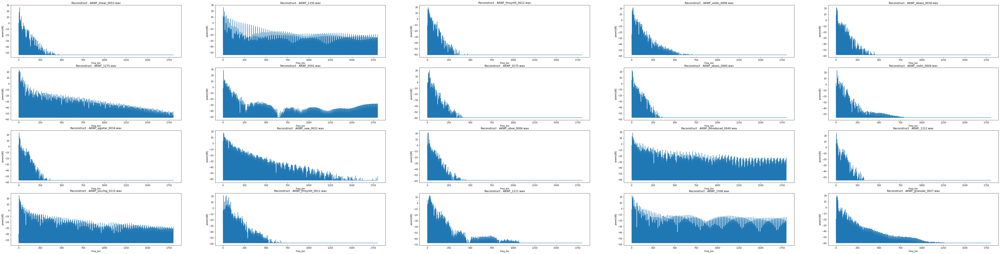

In [78]:
# 再構成したデータの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x
  x = x.unsqueeze(0)
  _, _, predict_waveform = model_eval(x,attrs)
  x = _scw_combain_spec(predict_waveform,6)[0]

  axs[i//ncols, i%ncols].set_title("Reconstruct : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i //ncols, i % ncols].plot(x.cpu())

print("再構成データのスペクトラム")

訓練データの波形


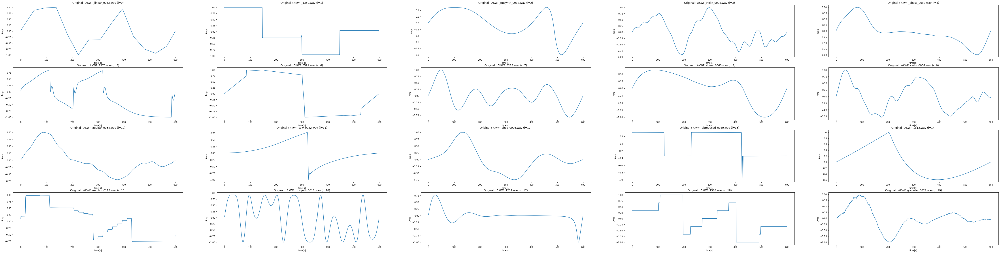

In [79]:
# 訓練データの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x

  axs[i//ncols, i%ncols].set_title("Original : " + attrs['name'] + " (i=" + str(i) + ")")
  axs[i//ncols, i%ncols].set_xlabel("time[s]")
  axs[i//ncols, i%ncols].set_ylabel("Amp")
  axs[i //ncols, i % ncols].plot(x[0])

print("訓練データの波形")
#print(axs)

再構成データの波形


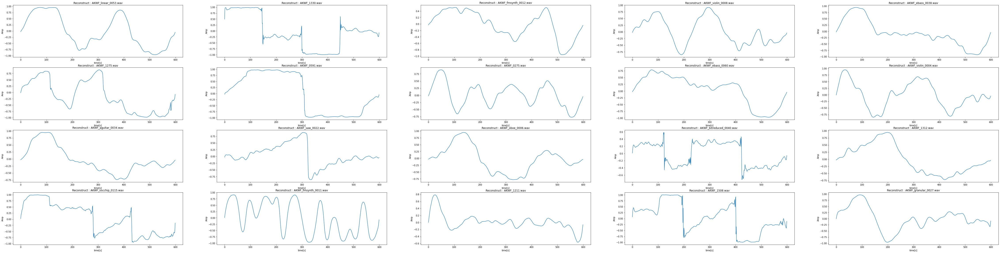

In [80]:
# 再構成したデータの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x 
  unsqueeze_waveform = x.unsqueeze(0)
  _, _, predict_waveform = model_eval(unsqueeze_waveform,attrs)
  predict_waveform = predict_waveform[0,0]
  predict_waveform = predict_waveform.cpu()
  #print(predict_waveform.shape)
  axs[i//ncols, i%ncols].set_title("Reconstruct : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("time[s]")
  axs[i//ncols, i%ncols].set_ylabel("Amp")
  axs[i // 5, i % 5].plot(predict_waveform)

print("再構成データの波形")

再構成データのスペクトラム


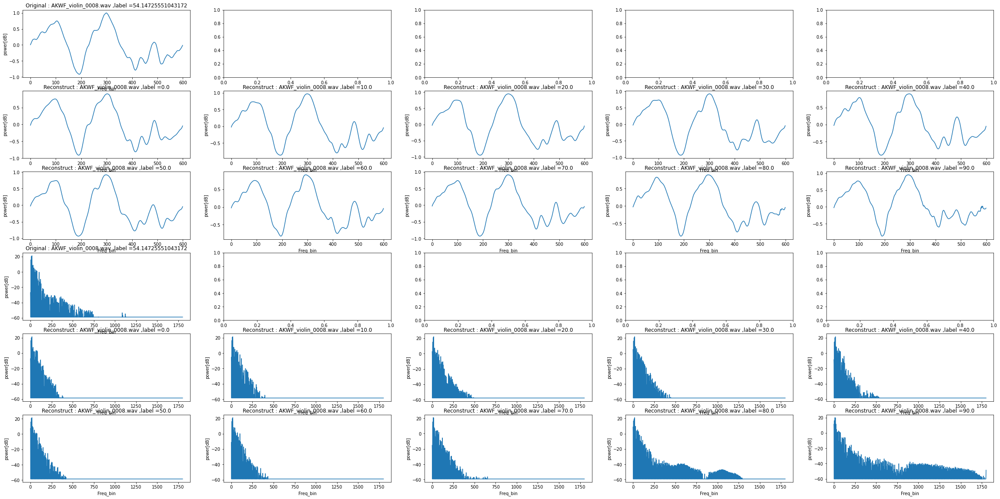

In [83]:
nrows = 4
ncols = 5
idx = 3

def plot_all(x,attrs,i,me):
  axs[i//ncols, i%ncols].set_title( me + " : " + attrs['name'] + " ,label =" + str(attrs['roughness']))
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i//ncols, i % ncols].plot(x.cpu())


# 再構成した明るさを変えていく
fig, axs = plt.subplots(nrows=nrows+2, ncols=ncols, figsize=(40,20))
fig.patch.set_facecolor("white")
for i in range(10):
  if i >= 10: break
  else:
    if i == 0:
      x, attrs = dm.train_dataset[idx]
      me = "Original"
      plot_all(x[0],attrs,i,me)
      x = _scw_combain_spec(x,6)[0]
      plot_all(x,attrs,i+15,me)

    x, attrs = dm.train_dataset[idx]
    #attrs['brightness'] = (100 / 10) * i
    attrs['roughness'] = (100 / 10) * i
    me = "Reconstruct"
    x = x.unsqueeze(0)
    _, _, x = model_eval(x,attrs)
    plot_all(x[0,0],attrs,i+5,me)
    x = _scw_combain_spec(x,6)[0]
    plot_all(x,attrs,i+20,me)

print("再構成データのスペクトラム")

## 確認用に簡易的なWavetable Synthを作ろう

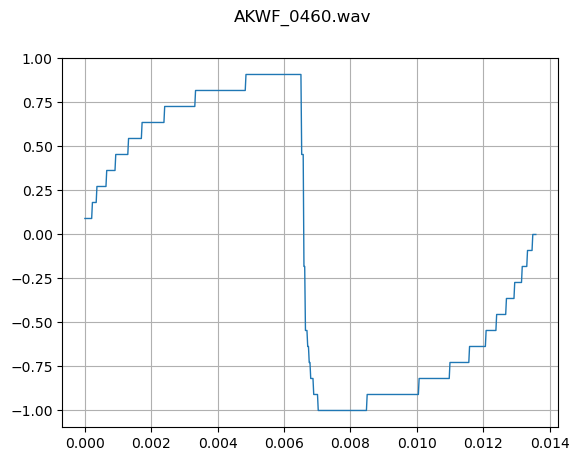

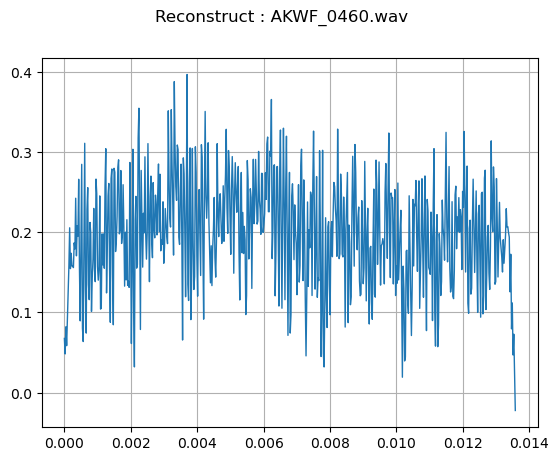

0.16131320900001356


In [30]:
#@title 簡易Wavetable Synth { display-mode: "form" }
import math
from math import tau
import torchaudio
import IPython.display as ipd
import ipywidgets as widgets
from IPython.display import display

sample_rate = 44100 #@param ["8000","11205","16000","22050", "32000","44100", "48000"] {type:"raw"}
duration = 1         #@param {type:"integer"}
frequency = 440   #@param {type:"integer"}
amplitude = 1
start_phase = 0      #@param {type:"slider", min:0, max:1, step:0.1}
change_random_flg = True #@param {type:"boolean"}

if change_random_flg:
    wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
    _, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
    predict_wavetable = predict_wavetable.cpu()
else:
    pass

def wavetableSynth(wavetable:torch.Tensor, sample_rate:int, duration:int, freaquency:int, amplitude:float, start_phase:float) -> np.ndarray:

    # Reference :https://stackoverflow.com/questions/64415839/making-a-wavetable-synth-for-the-first-time-can-somebody-point-me-in-the-right

    #wavetable, sr = torchaudio.load("sine.flac")
    wavetable = wavetable.reshape(-1)
    # indices for the wavetable values; this is just for `np.interp` to work
    wavetable_period = float(len(wavetable))
    wavetable_indices = np.linspace(0, wavetable_period,
                                    len(wavetable), endpoint=False)

    # frequency of the wavetable played at native resolution
    wavetable_freq = sample_rate / wavetable_period

    # start index into the wavetable
    start_index = start_phase * wavetable_period / tau

    # code above you run just once at initialization of this wavetable ↑
    # code below is run for each audio chunk ↓

    # samples of wavetable per output sample
    shift = frequency / wavetable_freq

    # fractional indices into the wavetable
    indices = np.linspace(start_index, start_index + shift * sample_rate * duration,
                        sample_rate * duration, endpoint=False)

    # linearly interpolated wavetable sampled at our frequency
    audio = np.interp(indices, wavetable_indices, wavetable, period=wavetable_period)
    audio *= amplitude

    sample_count = math.floor(sample_rate * duration)
    # at last, update `start_index` for the next chunk
    start_index += shift * sample_count

    audio = audio.reshape(1,-1)
    return audio

import time

start = time.perf_counter()

#print("入力データ")
plot_waveform(wavetable, attrs["samplerate"], title=attrs["name"])
audio = wavetableSynth(wavetable, sample_rate, duration, frequency, amplitude, start_phase)
display(Audio(audio, rate=sample_rate))

#print("再構成データ")
plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
predict_audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
display(Audio(predict_audio, rate=sample_rate))

print(time.perf_counter() - start)


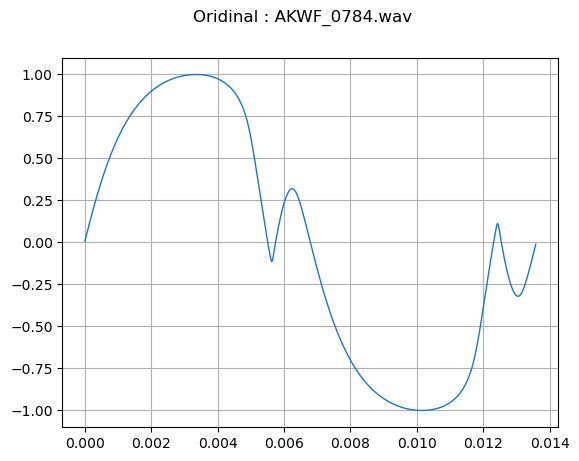

default_brightness 41.812464663505786
0


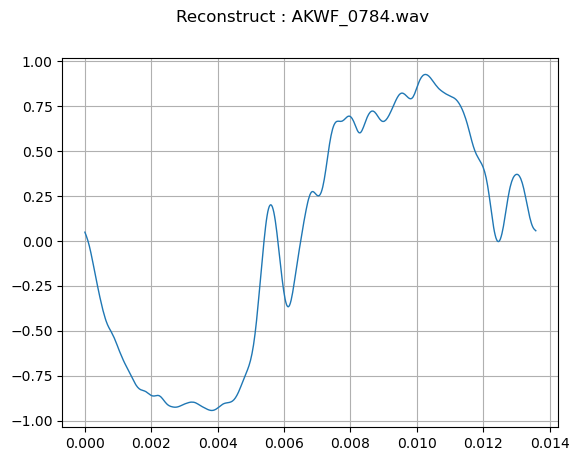

20


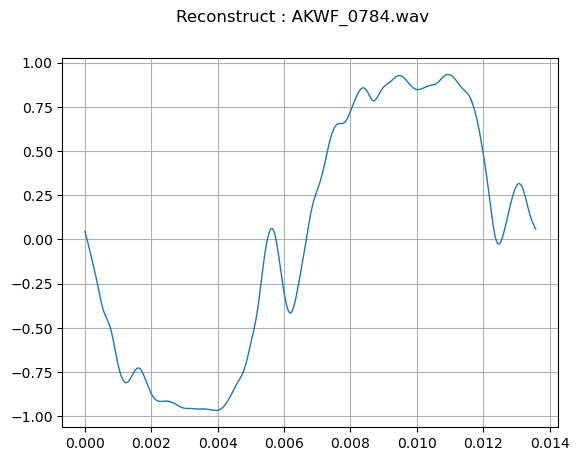

40


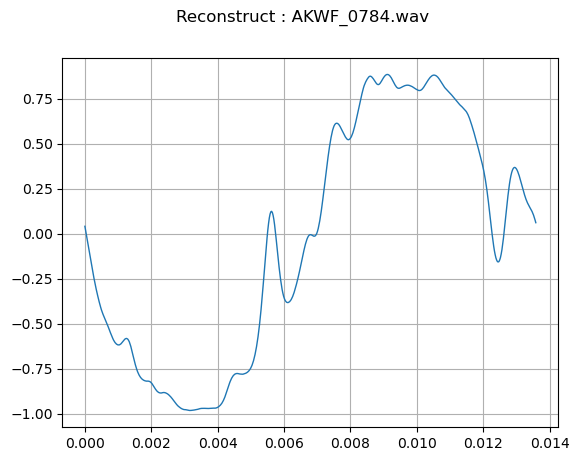

60


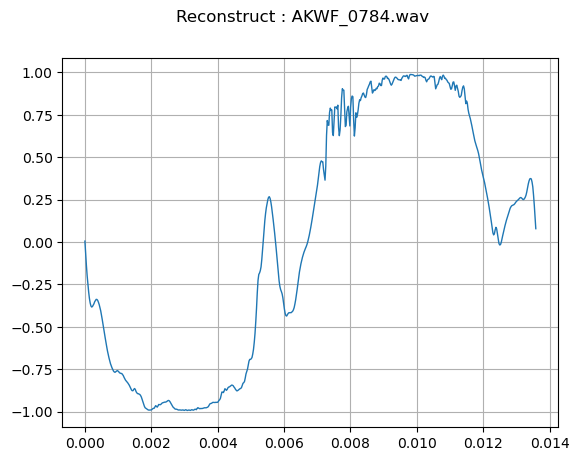

80


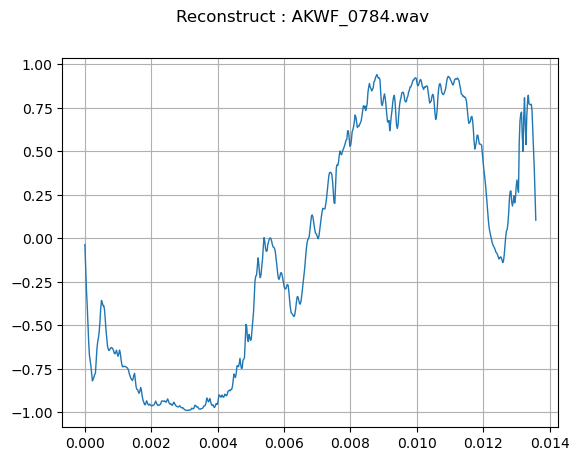

In [168]:
#wavetable, attrs = dm.test_dataset[random.randint(0,len(dm.train_dataset))]
wavetable, attrs = dm.test_dataset[0]
plot_waveform(wavetable, attrs["samplerate"], title="Oridinal : " + attrs["name"])
print("default_brightness",attrs['brightness'])

for i in np.arange(0, 100, 20):
    attrs['brightness'] = i
    #attrs['roughness'] = i
    #attrs['depth'] = i
    _, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
    predict_wavetable = predict_wavetable.cpu()
    print(attrs['brightness'])
    plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
    audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
    display(Audio(audio, rate=sample_rate))
    

In [78]:
import numpy as np
from scipy import signal

_, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
#han_predict_wavetable = predict_wavetable.cpu() * np.hanning(600)
han_predict_wavetable = predict_wavetable.cpu() * signal.hann(600)

plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
plot_waveform(han_predict_wavetable[0], attrs["samplerate"], title="Reconstruct+Han : " + attrs["name"])

#audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
#display(Audio(audio, rate=sample_rate))

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [ ]:
#ちゃんとどのような挙動になっているか確認する

# 波形を6つくっつけてSTFTする
copy_count = 6

#wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
wavetable, attrs = dm.train_dataset[0]

#print(wavetable.shape)
plot_waveform(wavetable, attrs["samplerate"])

#wavetable = torch.randn(32,1,600)
#print(len(wavetable[:]))
#batch_size = len(wavetable[:])

#wavetable = wavetable.reshape(batch_size, -1)
# indices for the wavetable values; this is just for `np.interp` to work
wavetable_period = len(wavetable[0,:])

tmp_wavetable = wavetable

for i in range(copy_count-1):
    tmp_wavetable = torch.cat([tmp_wavetable,  wavetable])
    #print(i)
combain_wavetables = tmp_wavetable.reshape(1, -1)
plot_waveform(combain_wavetables, attrs["samplerate"])

print(combain_wavetables.shape)


spec = torchaudio.transforms.Spectrogram(
                                         n_fft = int(wavetable_period*(copy_count)),
                                         hop_length = int(wavetable_period*(copy_count)),
                                         win_length = int(wavetable_period*(copy_count)),
                                         center=False,
                                         pad=0,
                                         window_fn = torch.hann_window,
                                         normalized=True,
                                         onesided=True,
                                         #return_complex = True,
                                         power=2.0)

ToDB = torchaudio.transforms.AmplitudeToDB()


spec_wavetable = ToDB(spec(combain_wavetables).abs())
spec_wavetable =spec_wavetable[0]
print(spec_wavetable.shape)
print(len(spec_wavetable[0]))
#spec_wavetable = spec_wavetable[0,:901,1:-1]
#print(spec_wavetable.shape)

plt.figure(figsize=(16,10))
plt.pcolor(spec_wavetable, cmap=plt.cm.Blues)

In [ ]:
x = torch.randn(1,3600)
duplicate_num = 6

spec =  torchaudio.transforms.Spectrogram(
                                                       #sample_rate = sample_rate,
                                                       n_fft = int(sample_points*(duplicate_num)), #時間幅
                                                       hop_length = int(sample_points*(duplicate_num)), #移動幅
                                                       win_length = int(sample_points*(duplicate_num)), #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=2.0)

ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'power',top_db = 80)

spec_x = ToDB(spec(x))
print(spec_x.shape)

# 5.その他